

# DH. Дневники.


Проанализировать файлы с дневниками.

In [6]:
import pandas as pd
from pathlib import Path
!pip install sweetviz
import sweetviz as sv
import csv

In [29]:
data4 = ""
with open('/content/whole_table.csv', newline='', encoding="utf-8") as file:
  data4 = file.read().replace(",#", "\t")
with open('/content/whole_table8.csv', "w", encoding="utf-8") as file:
  file.write(data4)

In [30]:
whole = pd.read_csv(Path('/content/whole_table8.csv'), sep='\t')

In [31]:
#whole = pd.DataFrame()
whole.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384526 entries, 0 to 384525
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  384526 non-null  int64 
 1   notes       384525 non-null  object
 2   dates       384526 non-null  object
 3   id          384526 non-null  int64 
 4   author      384526 non-null  object
dtypes: int64(2), object(3)
memory usage: 14.7+ MB


In [32]:
data4 = ""
with open('/content/whole_table_with_lemm.csv', newline='', encoding="utf-8") as file:
  data4 = file.read().replace(",#", "\t")
with open('/content/whole_table_with_lemm8.csv', "w", encoding="utf-8") as file:
  file.write(data4)

In [33]:
lemm = pd.read_csv(Path('/content/whole_table_with_lemm8.csv'), sep='\t')

In [34]:
lemm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384526 entries, 0 to 384525
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  384526 non-null  int64 
 1   notes       384525 non-null  object
 2   notes
      384525 non-null  object
 3   dates       384526 non-null  object
 4   id          384526 non-null  int64 
 5   author      384526 non-null  object
dtypes: int64(2), object(4)
memory usage: 17.6+ MB


In [35]:
whole.head()

,Unnamed: 0,notes,dates,id,author
0,0,Воскресенье. \nВчера приехал Слава навестит...,0/0/0,2950,Василий Сергеевич Савельев
1,1,"Ночью мы достигли банки Антон-Дорн, в Датском ...",0/0/0,2268,Олег Владимирович Амитров
2,2,Суббота. Москва. Еду в Селище.,0/12/21,795,Сергей Иванович Танеев
3,3,18 Августа Его Королевское Величество отправил...,1609/8/18,1081,Самуил Бельский
4,4,"На следующий день, 19 Августа, прибыл в Остров...",1609/8/19,1081,Самуил Бельский


In [36]:
lemm.head()

,Unnamed: 0,notes,notes\n,dates,id,author
0,0,Воскресенье. \nВчера приехал Слава навестит...,воскресение. \nвчера приезжать слава навеща...,0/0/0,2950,Василий Сергеевич Савельев
1,1,"Ночью мы достигли банки Антон-Дорн, в Датском ...","ночь мы достигать банка антон-дорн, в датский ...",0/0/0,2268,Олег Владимирович Амитров
2,2,Суббота. Москва. Еду в Селище.,суббота. москва. ехать в селище.\n,0/12/21,795,Сергей Иванович Танеев
3,3,18 Августа Его Королевское Величество отправил...,18 август его королевский величество отправлят...,1609/8/18,1081,Самуил Бельский
4,4,"На следующий день, 19 Августа, прибыл в Остров...","на следующий день, 19 август, прибывать в остр...",1609/8/19,1081,Самуил Бельский


In [37]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [88]:
#if whole['dates']!='0/0/0':
#  whole['dates'] = pd.to_datetime(whole['dates'], format="%Y-%m-%d").dt.year
#if lemm['dates']!='0/0/0':  
#  lemm['dates'] = pd.to_datetime(lemm['dates'], format="%Y-%m-%d").dt.month

In [47]:
f_whole = sv.FeatureConfig(skip=["id"] )

In [49]:
whole_report = sv.analyze(whole)

                                             |          | [  0%]   00:00 -> (? left)

In [59]:
whole_report.show_html(Path('/content/whole.html')) 

Report /content/whole.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [60]:
lemm_report = sv.analyze(lemm)

                                             |          | [  0%]   00:00 -> (? left)

In [61]:
lemm_report.show_html(Path('/content/lemm.html')) 

Report /content/lemm.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [94]:
whole['year'] = whole['dates']

In [95]:
whole.head()

,Unnamed: 0,notes,dates,id,author,year
0,0,Воскресенье. \nВчера приехал Слава навестит...,0/0/0,2950,Василий Сергеевич Савельев,0/0/0
1,1,"Ночью мы достигли банки Антон-Дорн, в Датском ...",0/0/0,2268,Олег Владимирович Амитров,0/0/0
2,2,Суббота. Москва. Еду в Селище.,0/12/21,795,Сергей Иванович Танеев,0/12/21
3,3,18 Августа Его Королевское Величество отправил...,1609/8/18,1081,Самуил Бельский,1609/8/18
4,4,"На следующий день, 19 Августа, прибыл в Остров...",1609/8/19,1081,Самуил Бельский,1609/8/19


In [97]:
whole_report = sv.analyze(whole, target_feat='id', feat_cfg=f_whole)

                                             |          | [  0%]   00:00 -> (? left)

In [98]:
whole_report.show_html(Path('/content/whole_id.html')) 

Report /content/whole_id.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [119]:
f_whole2 = sv.FeatureConfig(skip=["dates"] )

In [120]:
whole_report2 = sv.analyze(whole, feat_cfg=f_whole2)

                                             |          | [  0%]   00:00 -> (? left)

In [121]:
whole_report2.show_html(Path('/content/whole_dates2.html')) 

Report /content/whole_dates2.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


Text(0.5, 1.0, 'Missing  values  heatmap')

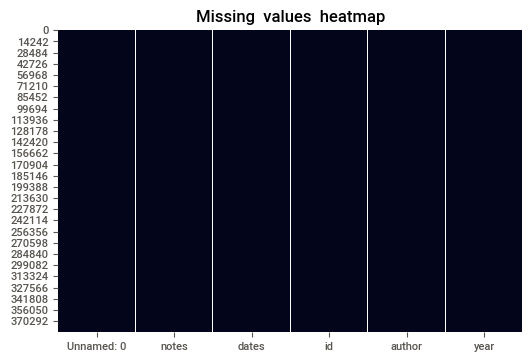

In [122]:
import seaborn as sns
sns.heatmap(whole.isnull(), cbar = False).set_title("Missing  values  heatmap")

In [123]:
whole.nunique()#количество уникальных значений

Unnamed: 0    384526
notes         383590
dates          68846
id              1516
author          1498
year           68846
dtype: int64

In [124]:
whole.describe()

,Unnamed: 0,id
count,384526.000000,384526.000000
mean,192262.500000,730.584158
std,111003.239142,669.928649
min,0.000000,3.000000
25%,96131.250000,196.000000
50%,192262.500000,519.000000
75%,288393.750000,991.000000
max,384525.000000,3505.000000


In [134]:
whole_year = whole.groupby('year').sum()
whole_year

,Unnamed: 0,id
year,,
0/0/0,1,5218
0/12/21,2,795
1609/10/1,46,1081
1609/10/10,55,1081
1609/10/11,56,1081
1609/10/12,57,1081
1609/10/13,58,1081
1609/10/14,59,1081
1609/10/15,60,1081


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5e10030cc0>,
      dtype=object)

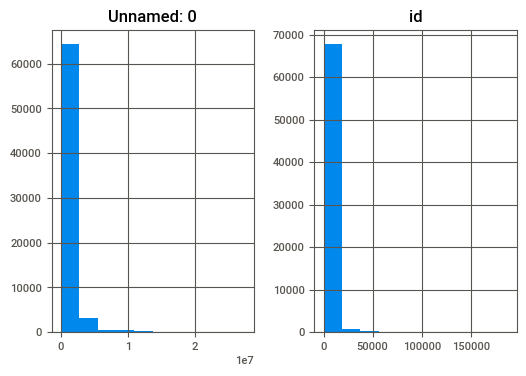

In [126]:
whole_year.hist()

In [131]:
whole_author = whole.groupby('author').sum()
whole_author.head

<bound method NDFrame.head of                                                     Unnamed: 0       id
author                                                                 
        Штукатуров                                    10752387    36828
      Аноним                                           7725413    18330
     Аноним                                          121495837   118638
     Света                                             1874806     2674
    Аноним                                             5764746     8632
    Аноним                                              313350      524
   Аноним                                            300389722  3817130
   Анонимы                                             1146027    22858
   Васёна                                             22240037    95832
   К.                                                  3789948    12259
   Катя и Маруся                                      15721439   250715
   Кудряшов                       

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5e0fdf36d8>,
      dtype=object)

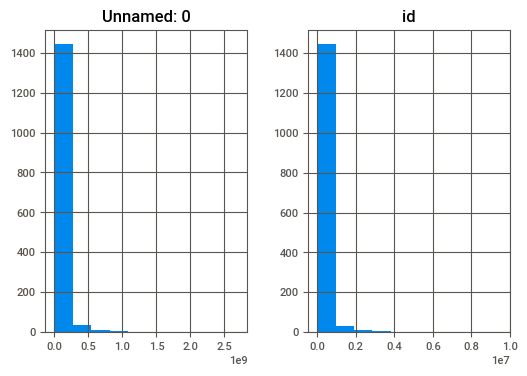

In [133]:
whole_author.hist()

In [1]:
whole_notes = whole.groupby('notes').sum()
whole_notes.head(5)

NameError: ignored

In [53]:
feature_config_comp = sv.FeatureConfig(skip=["notes", "id",
                                             "dates", 
                                             ] )

In [135]:
#comp_report = sv.compare([whole, "whole"], [lemm, "lemm"], "author", feature_config_comp)

In [ ]:
comp_report.show_html(Path('../visuals/compare.html')) 

Report compare.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5e193ef6a0>,
      dtype=object)

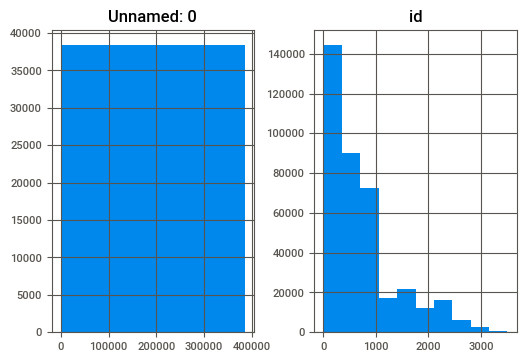

In [64]:
whole.hist(bins=10)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5e19347cf8>,
      dtype=object)

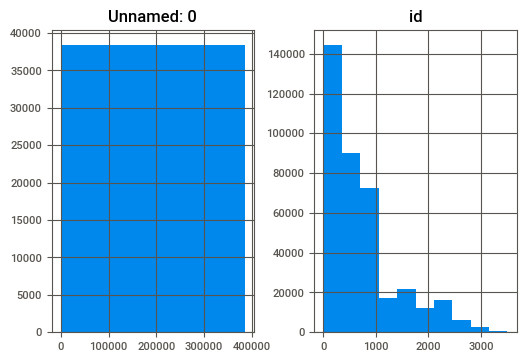

In [65]:
lemm.hist(bins=10)